In [1]:
%matplotlib notebook
import numpy as np
import pandas
import matplotlib.pyplot as plt
import os
from pprint import pprint

In [2]:
from pyprosp import prospector
from pyprosp import spectrum
from pyprosp import phys_params

# Data

In [3]:
data = {"SN_name":"NGC4163",
        "zcmb":0.000551,
        "GALEX.FUV":5.91561634e-08, 
        "GALEX.FUV.err":5.91561634e-09, 
        "GALEX.NUV":8.87156012e-08, 
        "GALEX.NUV.err":8.87156012e-09, 
        "sdss.u":2.22843515e-07,
        "sdss.u.err":2.22843515e-08,
        "sdss.g":4.87528490e-07,
        "sdss.g.err":4.87528490e-08,
        "sdss.r":6.98232404e-07,
        "sdss.r.err":6.98232404e-08,
        "sdss.i":8.79022517e-07,
        "sdss.i.err":8.79022517e-08,
        "sdss.z":9.46237161e-07,
        "sdss.z.err":9.46237161e-08, 
        "Spitzer.irac_1":4.32513831e-07, 
        "Spitzer.irac_1.err":4.32513831e-08, 
        "Spitzer.irac_2":2.80543364e-07, 
        "Spitzer.irac_2.err":2.80543364e-08, 
        "Spitzer.irac_3":1.95884467e-07, 
        "Spitzer.irac_3.err":1.95884467e-08, 
        "Spitzer.irac_4":1.29419584e-07, 
        "Spitzer.irac_4.err":1.29419584e-08, 
        }

data = pandas.Series(data)
data

SN_name                   NGC4163
zcmb                     0.000551
GALEX.FUV             5.91562e-08
GALEX.FUV.err         5.91562e-09
GALEX.NUV             8.87156e-08
GALEX.NUV.err         8.87156e-09
sdss.u                2.22844e-07
sdss.u.err            2.22844e-08
sdss.g                4.87528e-07
sdss.g.err            4.87528e-08
sdss.r                6.98232e-07
sdss.r.err            6.98232e-08
sdss.i                8.79023e-07
sdss.i.err            8.79023e-08
sdss.z                9.46237e-07
sdss.z.err            9.46237e-08
Spitzer.irac_1        4.32514e-07
Spitzer.irac_1.err    4.32514e-08
Spitzer.irac_2        2.80543e-07
Spitzer.irac_2.err    2.80543e-08
Spitzer.irac_3        1.95884e-07
Spitzer.irac_3.err    1.95884e-08
Spitzer.irac_4         1.2942e-07
Spitzer.irac_4.err     1.2942e-08
dtype: object

# Prospector SED fitting

In [4]:
prosp = prospector.Prospector(phot=data, spec=None, unit="mgy", z=data.zcmb, name=data.SN_name)

In [5]:
prosp.build_obs(phot_mask=None, verbose=True, warnings=True)


#===============#
#   Built obs   #
#===============#

{'filternames': ['galex_FUV',
                 'galex_NUV',
                 'sdss_u0',
                 'sdss_g0',
                 'sdss_r0',
                 'sdss_i0',
                 'sdss_z0',
                 'spitzer_irac_ch1',
                 'spitzer_irac_ch2',
                 'spitzer_irac_ch3',
                 'spitzer_irac_ch4'],
 'filters': [<class 'sedpy.observate.Filter'>(galex_FUV),
             <class 'sedpy.observate.Filter'>(galex_NUV),
             <class 'sedpy.observate.Filter'>(sdss_u0),
             <class 'sedpy.observate.Filter'>(sdss_g0),
             <class 'sedpy.observate.Filter'>(sdss_r0),
             <class 'sedpy.observate.Filter'>(sdss_i0),
             <class 'sedpy.observate.Filter'>(sdss_z0),
             <class 'sedpy.observate.Filter'>(spitzer_irac_ch1),
             <class 'sedpy.observate.Filter'>(spitzer_irac_ch2),
             <class 'sedpy.observate.Filter'>(spitzer_irac_ch3),
    

In [6]:
#prosp.describe_templates(["parametric_sfh", "dust_emission", "nebular"])

In [7]:
prosp.build_model(model=None, templates=["parametric_sfh", "dust_emission", "nebular"], 
                  describe=False, verbose=True)


#=================#
#   Built model   #
#=================#

{'add_dust_emission': {'N': 1, 'init': True, 'isfree': False},
 'add_neb_continuum': {'N': 1, 'init': True, 'isfree': False},
 'add_neb_emission': {'N': 1, 'init': True, 'isfree': False},
 'dust2': {'N': 1,
           'init': 0.6,
           'isfree': True,
           'prior': <class 'prospect.models.priors.TopHat'>(mini=0.0,maxi=2.0),
           'units': 'optical depth at 5500AA'},
 'dust_type': {'N': 1, 'init': 0, 'isfree': False},
 'duste_gamma': {'N': 1,
                 'init': 0.001,
                 'isfree': False,
                 'prior': <class 'prospect.models.priors.LogUniform'>(mini=0.001,maxi=0.15),
                 'units': 'Mass fraction of dust in high radiation intensity.'},
 'duste_qpah': {'N': 1,
                'init': 4.0,
                'isfree': False,
                'prior': <class 'prospect.models.priors.TopHat'>(mini=0.5,maxi=7.0),
                'units': 'Percent mass fraction of PAHs in dust.

In [8]:
changes = {"dust2":{"init":0.05}, 
           "tage":{"init":13., "disp_floor":1.},
           "mass":{"init":1e8, "prior":{"name":"LogUniform", "mini":1e6, "maxi":1e10}, 
                   "init_disp": 1e6, "disp_floor":1e6},
           "tau":{"prior":{"name":"LogUniform", "mini":1e-1, "maxi":1e2}, "disp_floor":1.}, 
           }

prosp.modify_model(changes=changes, removings=None, verbose=True, warnings=True, describe=False)


#====================#
#   Previous model   #
#====================#

{'add_dust_emission': {'N': 1,
                       'init': True,
                       'isfree': False,
                       'name': 'add_dust_emission'},
 'add_neb_continuum': {'N': 1,
                       'init': True,
                       'isfree': False,
                       'name': 'add_neb_continuum'},
 'add_neb_emission': {'N': 1,
                      'init': True,
                      'isfree': False,
                      'name': 'add_neb_emission'},
 'dust2': {'N': 1,
           'init': 0.6,
           'isfree': True,
           'name': 'dust2',
           'prior': <class 'prospect.models.priors.TopHat'>(mini=0.0,maxi=2.0),
           'units': 'optical depth at 5500AA'},
 'dust_type': {'N': 1, 'init': 0, 'isfree': False, 'name': 'dust_type'},
 'duste_gamma': {'N': 1,
                 'init': 0.001,
                 'isfree': False,
                 'name': 'duste_gamma',
                 'pri

/Users/mart1/anaconda3/lib/python3.7/site-packages/pyprosp-0.2.2-py3.7.egg/pyprosp/prospector.py:416: UserWarning: 'disp_floor' is not included in 'tage' model parameters. Adding it...
/Users/mart1/anaconda3/lib/python3.7/site-packages/pyprosp-0.2.2-py3.7.egg/pyprosp/prospector.py:416: UserWarning: 'init_disp' is not included in 'mass' model parameters. Adding it...
/Users/mart1/anaconda3/lib/python3.7/site-packages/pyprosp-0.2.2-py3.7.egg/pyprosp/prospector.py:416: UserWarning: 'disp_floor' is not included in 'mass' model parameters. Adding it...
/Users/mart1/anaconda3/lib/python3.7/site-packages/pyprosp-0.2.2-py3.7.egg/pyprosp/prospector.py:416: UserWarning: 'disp_floor' is not included in 'tau' model parameters. Adding it...


In [9]:
prosp.build_sps(zcontinuous=1)

In [10]:
run_params = {"nested_method":"rwalk", 
              "nlive_init":400, 
              "nlive_batch":200, 
              "nested_dlogz_init":0.05, 
              "nested_posterior_thresh":0.05, 
              "nested_maxcall":int(1e7)}

prosp.run_fit(which="dynesty", run_params=run_params, savefile="short_dynesty.h5", 
              set_chains=False, verbose=True)

iter: 2139 | batch: 0 | nc: 1 | ncall: 9899 | eff(%): 21.608 | logz: 161.131 +/-  0.535 | dlogz:  0.000 >  0.050           


done dynesty (initial) in 836.8889110088348s


iter: 4635 | batch: 6 | nc: 3 | ncall: 21556 | eff(%): 20.824 | loglstar: 171.509 < 178.197 < 176.415 | logz: 161.255 +/-  0.522 | stop:  1.118     

done dynesty (dynamic) in 533.4680240154266s
Done 'dynesty' in 1370s.


/Users/mart1/anaconda3/lib/python3.7/site-packages/prospect-0.4.0-py3.7.egg/prospect/io/write_results.py:60: RuntimeWarning: Could not store paramfile text
/Users/mart1/anaconda3/lib/python3.7/site-packages/prospect-0.4.0-py3.7.egg/prospect/io/write_results.py:278: RuntimeWarning: Could not JSON serialize model_params, pickled instead


In [11]:
run_params = {"nwalkers":16, 
              "niter":1024, 
              "nburn":[128, 256, 512]}

prosp.run_fit(which="emcee", run_params=run_params, savefile="short_emcee.h5", set_chains=False, verbose=True)

number of walkers=16


/Users/mart1/anaconda3/lib/python3.7/site-packages/prospect-0.4.0-py3.7.egg/prospect/models/priors.py:104: RuntimeWarning: divide by zero encountered in log


done burn #0 (128 iterations)
done burn #1 (256 iterations)
done burn #2 (512 iterations)
number of walkers=16
starting production
done production
Done 'emcee' in 1032s.


# Working with SED fitting results

In [12]:
h5_choice = "dynesty" 

In [13]:
prosp_h5 = prospector.Prospector.from_h5(f"short_{h5_choice}.h5", warnings=True)

<IPython.core.display.Javascript object>


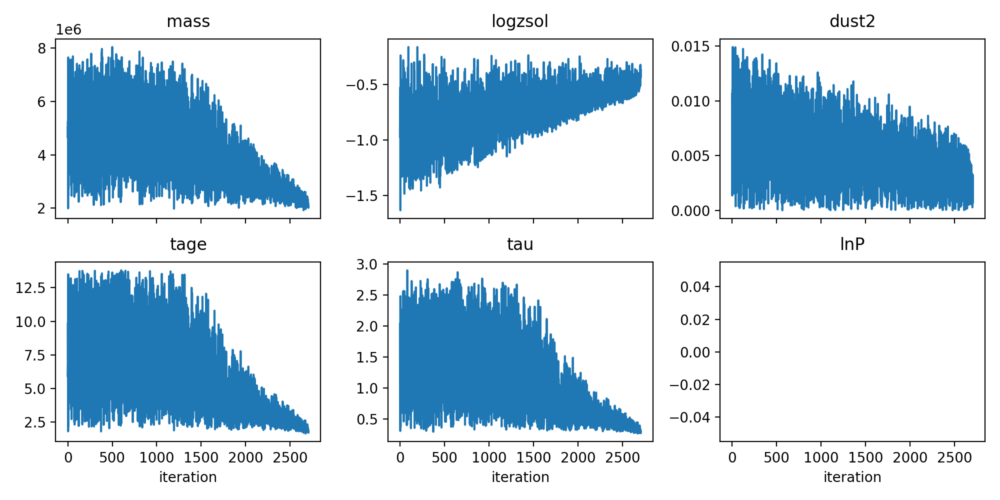

In [14]:
_ = prosp_h5.show_walkers(savefile=None, figsize=(10,5))

<IPython.core.display.Javascript object>


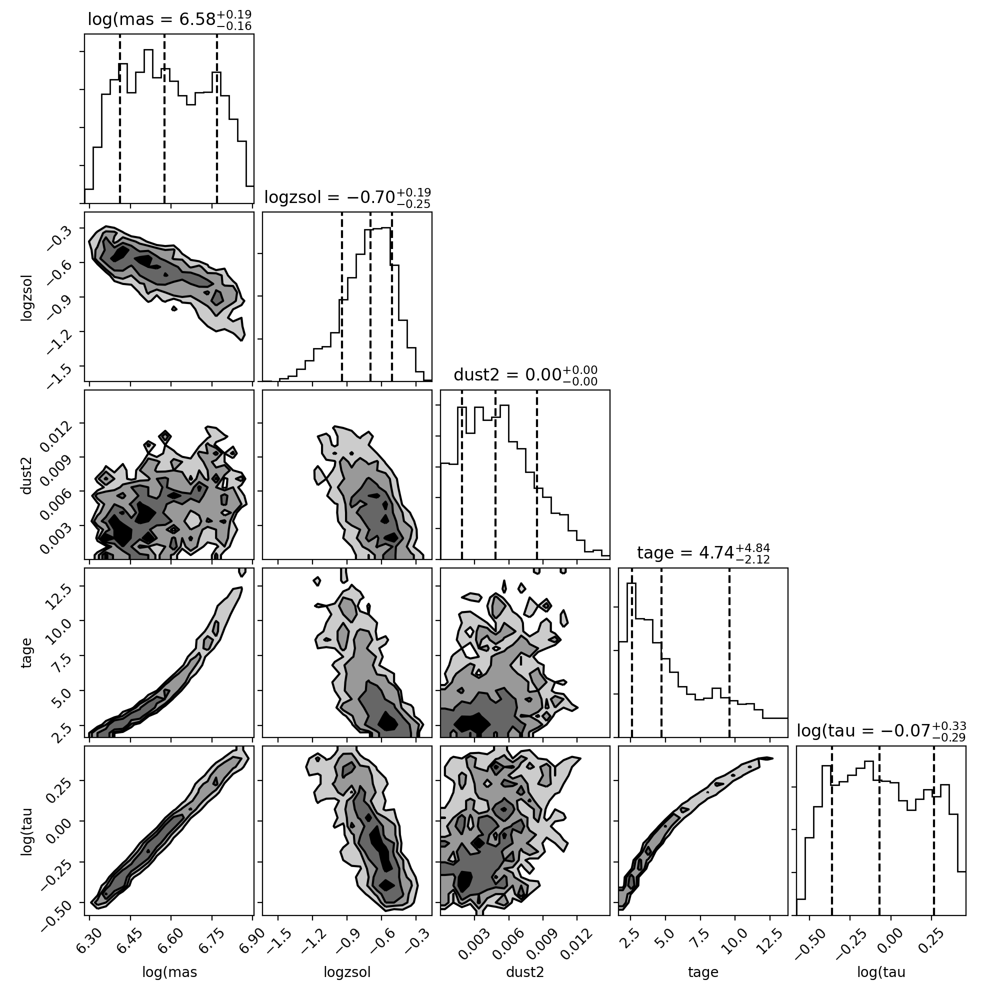

In [15]:
_ = prosp_h5.show_corner(fig=plt.subplots(5,5,figsize=(10,10))[0])

In [16]:
prosp_h5.fitted_params

{'mass': (3764050.6599676334, 1174945.1702520936, 2110352.558697902),
 'logzsol': (-0.6971462350180084, 0.24515690787392874, 0.18865684045334907),
 'dust2': (0.004828421437653411, 0.002961407362541044, 0.003648560813304792),
 'tage': (4.735238057768344, 2.119598147196094, 4.844350048851471),
 'tau': (0.8501010063020069, 0.4143075054988109, 0.9866533497987264)}

In [17]:
# Either recover the spectrum with:
# prosp_spec = prosp_h5.spectrum

# or with:
prosp_spec = spectrum.ProspectorSpectrum.from_h5(f"short_{h5_choice}.h5", warnings=True)

/Users/mart1/anaconda3/lib/python3.7/site-packages/pyprosp-0.2.2-py3.7.egg/pyprosp/spectrum.py:171: UserWarning: There is no group named "spec_chain" in the .h5 file you gave.
/Users/mart1/anaconda3/lib/python3.7/site-packages/pyprosp-0.2.2-py3.7.egg/pyprosp/spectrum.py:179: UserWarning: The spectrum chain is NOT loaded!


In [18]:
prosp_spec.load_spectra(from_file=None, size=None, savefile=f"short_{h5_choice}.h5", warnings=True)

In [19]:
prosp_spec.spec_chain

,0,1,2,3,4,5,6,7,8,9,...,2697,2698,2699,2700,2701,2702,2703,2704,2705,2706
lbda,,,,,,,,,,,,,,,,,,,,,
9.105014e+01,2.313880e-13,2.393084e-13,1.667024e-13,1.784781e-13,3.040513e-13,1.842367e-13,2.017029e-13,9.363769e-14,2.006889e-13,2.789927e-13,...,2.955062e-13,2.480604e-13,2.745823e-13,1.703443e-13,2.358161e-13,2.926486e-13,1.795688e-13,1.736700e-13,2.647836e-13,2.133355e-13
9.405179e+01,2.378938e-13,2.463338e-13,1.716430e-13,1.842332e-13,3.175246e-13,1.898061e-13,2.078764e-13,1.021400e-13,2.060345e-13,2.895337e-13,...,3.087858e-13,2.602035e-13,2.863087e-13,1.809268e-13,2.472040e-13,3.053773e-13,1.914433e-13,1.849061e-13,2.780949e-13,2.252775e-13
9.605290e+01,3.003538e-13,3.095679e-13,2.155234e-13,2.321212e-13,3.990133e-13,2.389352e-13,2.625915e-13,1.284440e-13,2.594746e-13,3.636147e-13,...,3.870883e-13,3.263754e-13,3.589915e-13,2.270909e-13,3.100647e-13,3.827915e-13,2.404427e-13,2.321726e-13,3.487268e-13,2.826752e-13
9.805400e+01,4.083157e-13,4.213422e-13,2.924768e-13,3.160029e-13,5.577162e-13,3.252221e-13,3.574229e-13,2.305402e-13,3.518168e-13,5.021436e-13,...,5.423691e-13,4.703973e-13,5.026111e-13,3.561914e-13,4.515404e-13,5.350233e-13,3.814712e-13,3.670941e-13,5.038217e-13,4.267867e-13
1.000551e+02,5.718784e-13,7.041985e-13,5.219523e-13,5.236314e-13,8.674188e-13,4.579512e-13,5.152887e-13,4.340466e-13,5.060453e-13,8.450879e-13,...,8.823995e-13,7.783209e-13,8.444122e-13,6.080018e-13,7.482317e-13,8.861708e-13,6.308478e-13,6.155169e-13,8.119178e-13,7.000089e-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9.643311e+07,2.056022e-08,1.789286e-08,1.193825e-08,1.628983e-08,1.434665e-08,2.080786e-08,1.885371e-08,1.214482e-08,1.769415e-08,1.655833e-08,...,1.127920e-08,1.122878e-08,1.184439e-08,1.134213e-08,1.199350e-08,1.155486e-08,1.119207e-08,1.120002e-08,1.085847e-08,1.137553e-08
9.732360e+07,2.060410e-08,1.789035e-08,1.192511e-08,1.628416e-08,1.433654e-08,2.082797e-08,1.889335e-08,1.214982e-08,1.770313e-08,1.657795e-08,...,1.127241e-08,1.123484e-08,1.184226e-08,1.135080e-08,1.200475e-08,1.154924e-08,1.120008e-08,1.120817e-08,1.086389e-08,1.138778e-08
9.822409e+07,2.063206e-08,1.791796e-08,1.194487e-08,1.630854e-08,1.435505e-08,2.083216e-08,1.891719e-08,1.215630e-08,1.772897e-08,1.660131e-08,...,1.128708e-08,1.124361e-08,1.185558e-08,1.135936e-08,1.201230e-08,1.156384e-08,1.120869e-08,1.121677e-08,1.087256e-08,1.139436e-08


<IPython.core.display.Javascript object>


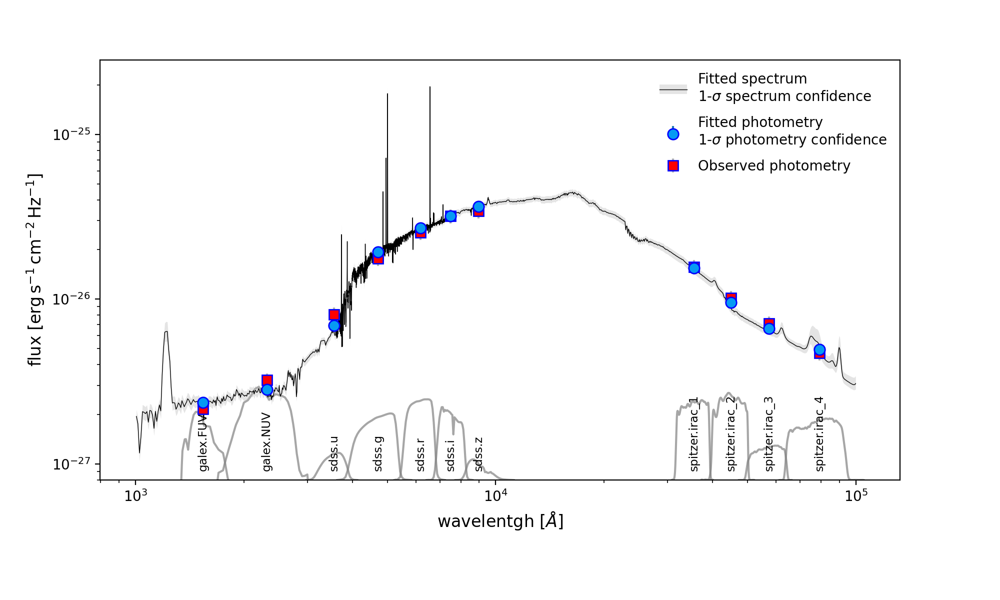

In [20]:
unit = "Hz"
lbda_lim = (1e3, 1e5)
restframe = False
filters = None

ax = None
figsize=(10,6)
ax_rect=[0.1, 0.2, 0.8, 0.7]
set_logx, set_logy = True, True
savefile = None

spec_prop = {"c":"k", "lw":0.5, "zorder":4}
spec_unc_prop = {"color":"0.7", "alpha":0.35, "lw":0, "zorder":2}
phot_prop = {"marker":"o", "s":60, "fc":"xkcd:azure", "ec":"b", "zorder":6}
phot_unc_prop = {"marker":"", "ls":"None", "ecolor":"C0", "zorder":5}
show_obs = {"marker":"s", "ms":7, "ls":"None", "mfc":"r", "mec":"b", "ecolor":"0.7", "zorder":4}
show_legend = {"loc":"best", "frameon":False, "labelspacing":0.8}
show_filters = {"lw":1.5, "color":"gray", "alpha":0.7, "zorder":1}

fig, ax = prosp_spec.show(ax=ax, figsize=figsize, ax_rect=ax_rect, unit=unit, restframe=restframe, 
                          lbda_lim=lbda_lim, spec_prop=spec_prop, spec_unc_prop=spec_unc_prop, 
                          filters=filters, phot_prop=phot_prop, phot_unc_prop=phot_unc_prop, 
                          show_obs=show_obs, show_legend=show_legend, set_logx=set_logx, set_logy=set_logy, 
                          show_filters=show_filters, savefile=savefile).values()

In [21]:
phot_data = prosp_spec.get_phot_data(filters=None, restframe=True, exp=3, unit="mag", plot_format=False)
pprint(phot_data)

{'galex.FUV': {'lbda': 1537.7737130805479,
               'phot': (17.970135838508558,
                        0.08158262926491844,
                        0.08361124252670393),
               'phot_chain': array([17.80217939, 17.80079947, 18.195626  , ..., 18.00621606,
       18.02139663, 17.99057203])},
 'galex.NUV': {'lbda': 2314.387876616991,
               'phot': (17.77052044084867,
                        0.06552033250153855,
                        0.07288030968736336),
               'phot_chain': array([17.68225642, 17.64745969, 18.0133681 , ..., 17.74331317,
       17.70145058, 17.7187456 ])},
 'sdss.g': {'lbda': 4716.237683423511,
            'phot': (15.687926760271152,
                     0.05301107355625412,
                     0.06024622482165576),
            'phot_chain': array([15.74444537, 15.59622986, 15.74631668, ..., 15.67259489,
       15.62760999, 15.66552195])},
 'sdss.i': {'lbda': 7496.361852493177,
            'phot': (15.139413762913742,
                 

In [22]:
# Either recover the spectrum with:
# prosp_params = prosp_h5.phys_params

# or with:
prosp_phys_params = phys_params.ProspectorPhysParams.from_h5(f"short_{h5_choice}.h5", warnings=True)

In [23]:
prosp_phys_params.get_phys_params()

/Users/mart1/anaconda3/lib/python3.7/site-packages/pyprosp-0.2.2-py3.7.egg/pyprosp/phys_params.py:410: UserWarning: You tried to set the physical parameter 'dust1' for which it raised the error:
<class 'KeyError'> --> "'dust_ratio' is not in the model.".
/Users/mart1/anaconda3/lib/python3.7/site-packages/pyprosp-0.2.2-py3.7.egg/pyprosp/phys_params.py:410: UserWarning: You tried to set the physical parameter 'tburst' for which it raised the error:
<class 'KeyError'> --> "'fage_burst' is not in the model.".


{'z': (0.000551, 0.0, 0.0),
 'mass': (3764050.6599676334, 1174945.1702520936, 2110352.558697902),
 'log_mass': (6.575655459918965, 0.1625057143859543, 0.19330828911245312),
 'sfr': (9.275566377252656e-05,
  1.1484826681218462e-05,
  1.2029563338823631e-05),
 'log_sfr': (-4.032659562359213, 0.057405704636673605, 0.05295961925259274),
 'ssfr': (2.4812993323844698e-11,
  9.245821152456798e-12,
  1.133133841923706e-11),
 'log_ssfr': (-10.605320841305657, 0.20246944767459674, 0.16336104078983205),
 'log_zsol': (-0.6971462350180084, 0.24515690787392874, 0.18865684045334907),
 'tage': (4.735238057768344, 2.119598147196094, 4.844350048851471),
 'tau': (0.8501010063020069, 0.4143075054988109, 0.9866533497987264),
 'dust2': (0.004828421437653411, 0.002961407362541044, 0.003648560813304792),
 'duste_gamma': (0.001, 0.0, 0.0),
 'duste_qpah': (4.0, 0.0, 0.0),
 'duste_umin': (1.0, 0.0, 0.0),
 'gas_logu': (-2.0, 0.0, 0.0)}

In [24]:
prosp_phys_params.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>